## Visualization of CNN: Grad-CAM
* **Objective**: Convolutional Neural Networks are widely used on computer vision. It is powerful for processing grid-like data. However we hardly know how and why it works, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.

* **To be submitted within 2 weeks**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!

* NB: if `PIL` is not installed, try `conda install pillow`.


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request

import numpy as np
from PIL import Image
import cv2

%matplotlib inline

### Download the Model
We provide you a pretrained model `ResNet-34` for `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **ResNet-34**: A deep architecture for image classification.

In [2]:
resnet34 = models.resnet34(pretrained=True)
resnet34.eval() # set the model to evaluation mode

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

![ResNet34](https://miro.medium.com/max/1050/1*Y-u7dH4WC-dXyn9jOG4w0w.png)

In [3]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl') )

### Input Images
We provide you 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [4]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])

    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [5]:
# The images should be in a *sub*-folder of "data/" (ex: data/TP2_images/images.jpg) and *not* directly in "data/"!
# otherwise the function won't find them

import os
os.mkdir("./data")
os.mkdir("./data/TP2_images")
!cd data/TP2_images && wget "https://www.lri.fr/~gcharpia/deeppractice/2022/TP2/TP2_images.zip" && unzip TP2_images.zip
dir_path = "./data" 
dataset = preprocess_image(dir_path)

--2022-02-02 21:54:45--  https://www.lri.fr/~gcharpia/deeppractice/2022/TP2/TP2_images.zip
Resolving www.lri.fr (www.lri.fr)... 129.175.15.11
Connecting to www.lri.fr (www.lri.fr)|129.175.15.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1477062 (1.4M) [application/zip]
Saving to: ‘TP2_images.zip’

TP2_images.zip      100%[===================>]   1.41M  2.52MB/s    in 0.6s    

2022-02-02 21:54:47 (2.52 MB/s) - ‘TP2_images.zip’ saved [1477062/1477062]

Archive:  TP2_images.zip
   creating: .ipynb_checkpoints/
  inflating: 155881293_721e90b57d.jpg  
  inflating: 158850087_3251644046.jpg  
  inflating: 1624593475_146bf1f7ff.jpg  
  inflating: 181748579_01a4611736.jpg  
  inflating: 2068921624_ef0986de13.jpg  
  inflating: 2637374064_fab14ec0b8.jpg  
  inflating: 2749465889_8e62023674.jpg  
  inflating: 2936812850_23bf0d1cfd.jpg  
  inflating: 3532471222_a6d7e3780e.jpg  
  inflating: 3633913271_ee789a3bc4.jpg  
  inflating: 3633949157_f577605ea9.jpg  
  infla

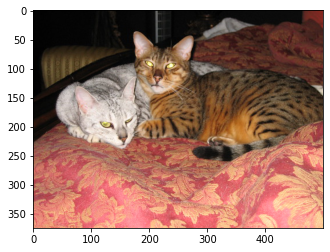

In [6]:
# show the orignal image 
index = 5
input_image = Image.open(dataset.imgs[5][0]).convert('RGB')
plt.imshow(input_image)

In [7]:
output = resnet34(dataset[index][0].view(1, 3, 224, 224))
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [285 281 282] ['Egyptian cat', 'tabby, tabby cat', 'tiger cat']
Raw class scores: [13.077121 10.977325 10.554378]


### Grad-CAM 
* **Overview:** Given an image, and a category (‘tiger cat’) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude. 


* **Hints**: 
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully. 
 + The pretrained model resnet34 doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly. 
 + The size of feature maps is 7x7, so your heatmap will have the same size. You need to project the heatmap to the resized image (224x224, not the original one, before the normalization) to have a better observation. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link of the paper [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

![Grad-CAM](https://da2so.github.io/assets/post_img/2020-08-10-GradCAM/2.png)

(conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)

In [8]:
from torchvision.models.resnet import ResNet
'''
GradCAM allows us to compute the following outputs: 
1. The activation map of the convolutional layer before Softmax activation 
2. The gradient of the class which we require for visualizing 
3. The weight matrix that is computed using pooling operation
    '''
def get_image_info(img):
    output = resnet34(img.view(1, 3, 224, 224))
    values, indices = torch.topk(output, 3)
    img_classes = [classes[x] for x in indices[0].numpy()]
    
    #Returns the image indice the raw-class score and the class of the image 
    return indices[0].numpy(), img_classes

#Hook registry function
def register_hook(model,input_img,class_idx,layer_name=str):
    '''
    Attaches forward and backward hook to the computational graph of the 
    specified model. 
    
    model = The model to be used for Grad-CAM 
    input_img = The image on which Grad-CAM has to be applied
    class_idx = The class for which the gradients have to be made 1 
    layer_name = The name of the last layer from which the activation map has to be hooked
    
    Returns: 
    The activation map from the forward hook, 
    The gradient map from backward hook
    '''
    activation = {}
    gradient = {}
    def getActivation(name):
      # the hook signature
        def hook(model, input, output):
            activation[name] = output
        return hook
    
    def getGradient(name):
        # the hook signature
        def hook(model, input, output):
            gradient[name] = output
        return hook
    
    #Attach hook and forward pass the input image to hook the activation maps
    model.layer4[2].conv2.register_forward_hook(getActivation(layer_name))
    model.layer4[2].conv2.register_full_backward_hook(getGradient(layer_name))
    #Forward pass and backward pass for both the hooks
    prediction = model(input_img)
    prediction[:,class_idx].backward()    
    return activation, gradient

#Image inversion function 
def inverse_image(image):
    inv_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
        std=[1/0.229, 1/0.224, 1/0.255]
    )

    image = inv_normalize(image[0]).numpy().transpose(1,2,0)
    return image 


#GradCAM output function  
def get_GradCAM_output(model,img):
    '''
    Computes the class activation mappings for a given class 
    
    Parameters: 
    
    model: The model on which Grad-CAM has to be implemented 
    img: The image for CAM 
    class_idx: The class which needs to be backpropped for backward computation of gradient
    
    Returns: 
    The Grad-CAM output 
    '''
    #Get the info on the image for looping 
    indices, classes = get_image_info(img)
    fig,ax = plt.subplots(1,3,figsize=(10,10),dpi=300) #Figure object for making subplots 
    
    img = img.view(1,3,224,224) #Fix image size 
    
    model.eval() #Set model in evaluation mode
    for indice, clss, axis in zip(indices,classes,ax.ravel()):
        output = model(img) #Obtain model output 

        activation, gradient = register_hook(model,img,indice,layer_name='conv2')
        activation = activation['conv2'].view(512,7,7) #Remove the batch dimension
        gradient = gradient['conv2'][0].view(512,7,7) #Remove the batch dimension 

        #Compute the neuron importance weights 
        alpha = torch.mean(gradient,[1,2])

        #Obtain the sum of the weighted activation maps 
        act_map_sum = 0
        for i in range(512):
            act_map_sum += activation[i,:,:] * alpha[i]

        #Heatmap 
        heatmap = np.maximum(act_map_sum.detach().numpy(),0) #ReLU 
        heatmap /= np.max(heatmap) #Normalize 

        #Resizing the image and producing the final image output
        heatmap = cv2.resize(heatmap,(224,224),cv2.INTER_NEAREST)
        heatmap = np.uint8(255 * heatmap)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

        image = inverse_image(img)
        
        axis.set_title(clss)
        axis.imshow(heatmap)
        axis.imshow(image,alpha=0.5)
        plt.tight_layout()
        
    plt.show()
#     plt.tight_layout()

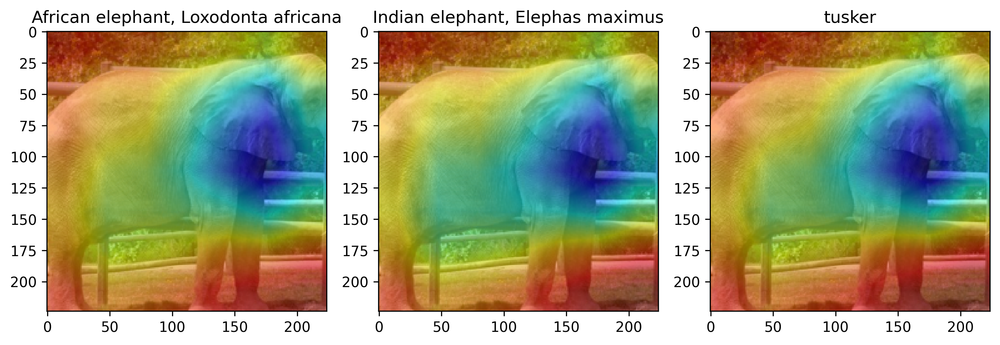

In [9]:
#Obtain the Grad-CAM output
get_GradCAM_output(resnet34,dataset[0][0])

### Now, we obtain the Grad-CAM for all the images in the dataset

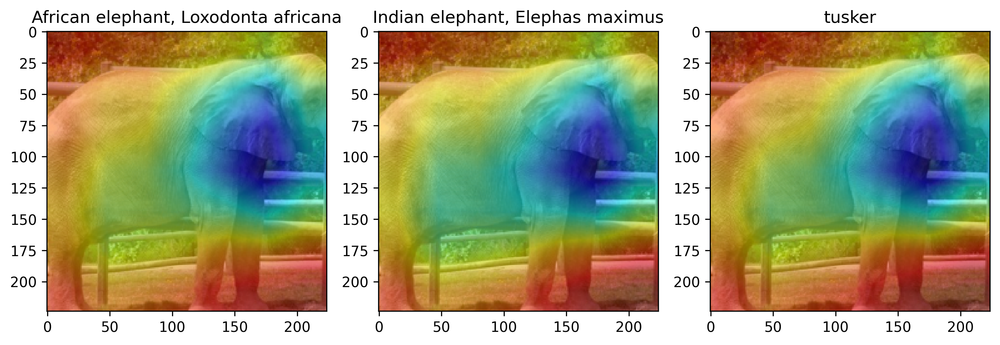

*************************************************************************************************************************************************


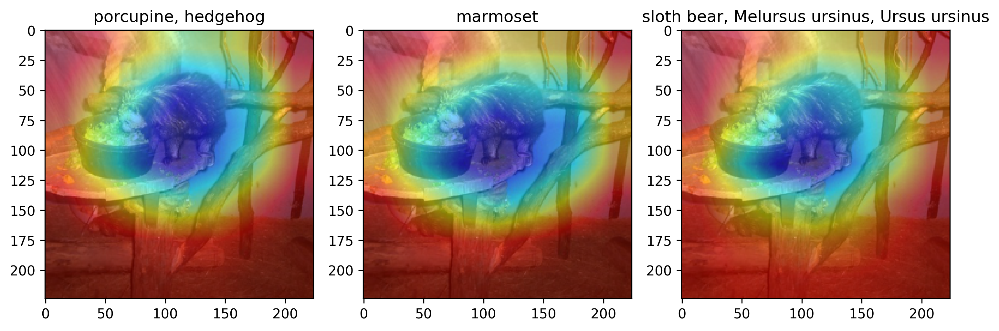

*************************************************************************************************************************************************


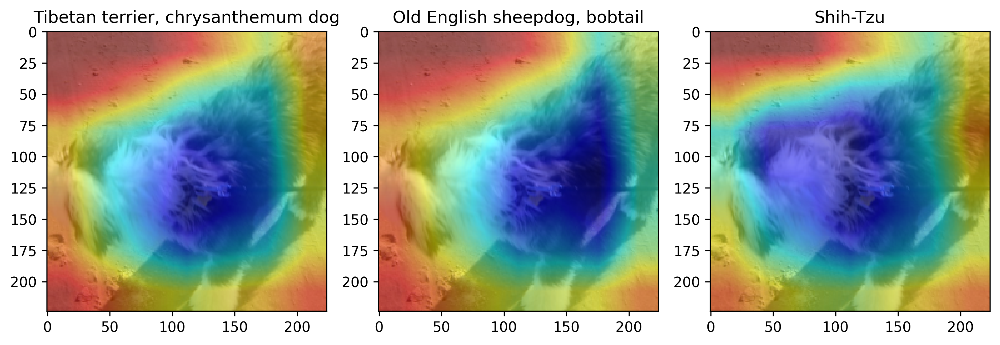

*************************************************************************************************************************************************


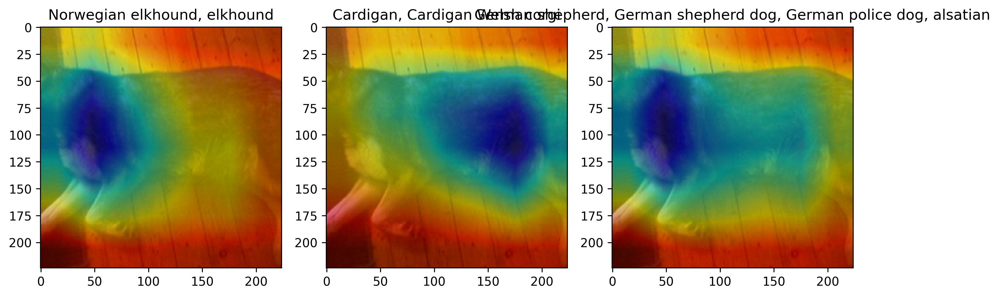

*************************************************************************************************************************************************


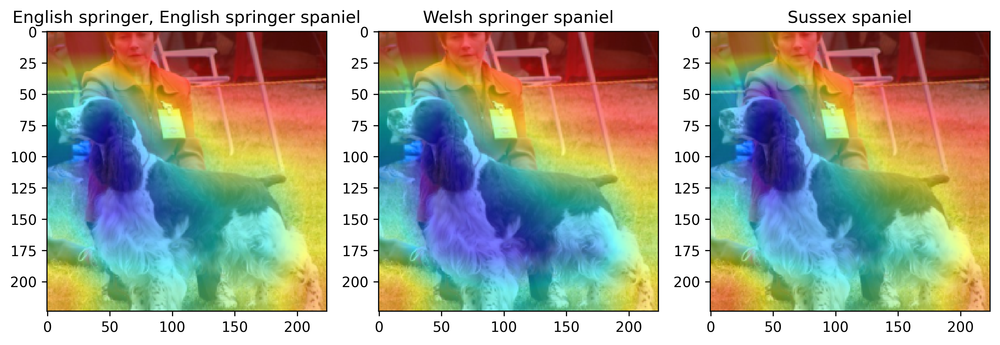

*************************************************************************************************************************************************


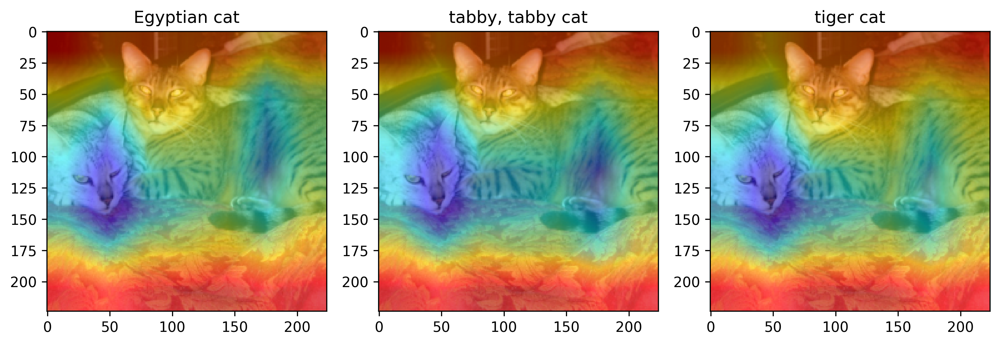

*************************************************************************************************************************************************


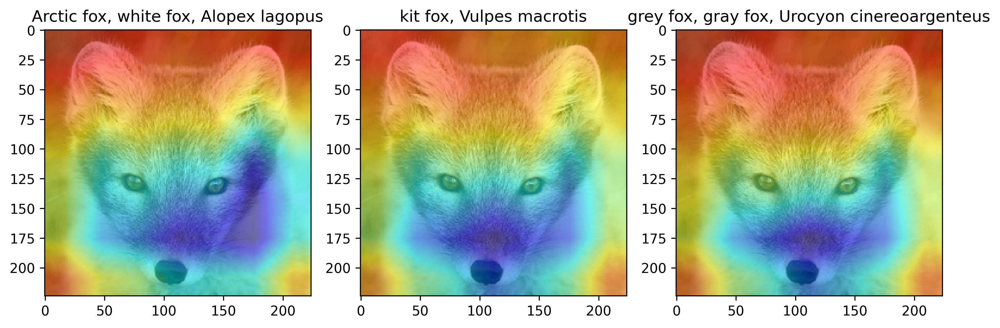

*************************************************************************************************************************************************


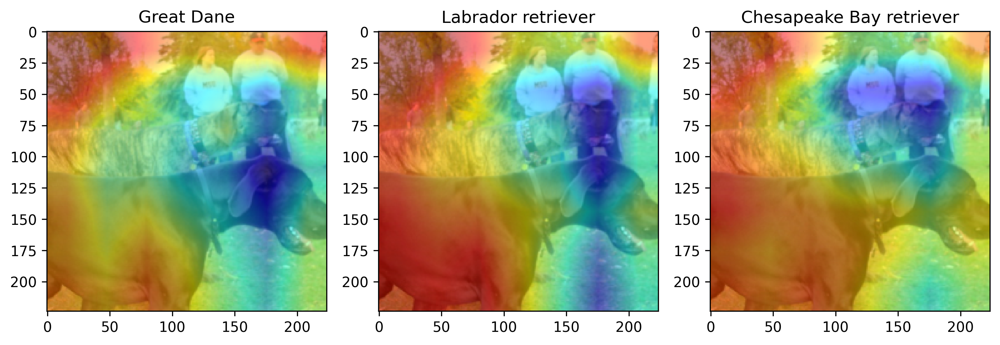

*************************************************************************************************************************************************


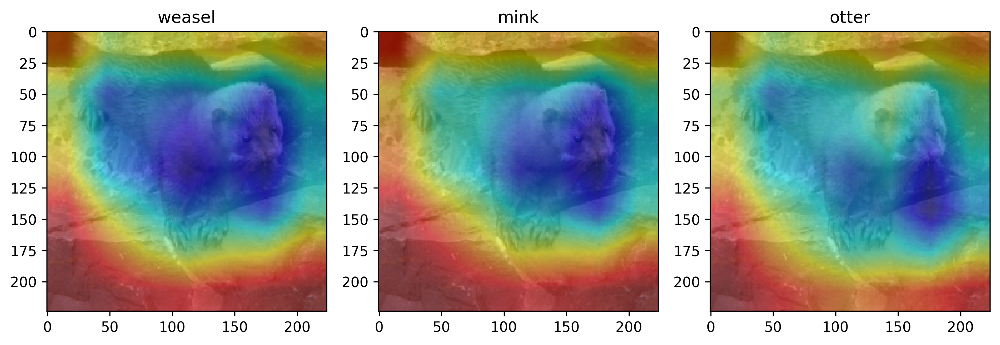

*************************************************************************************************************************************************


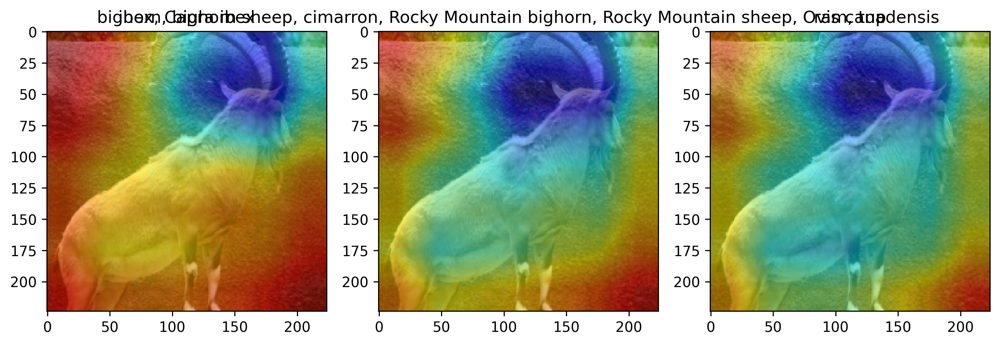

*************************************************************************************************************************************************


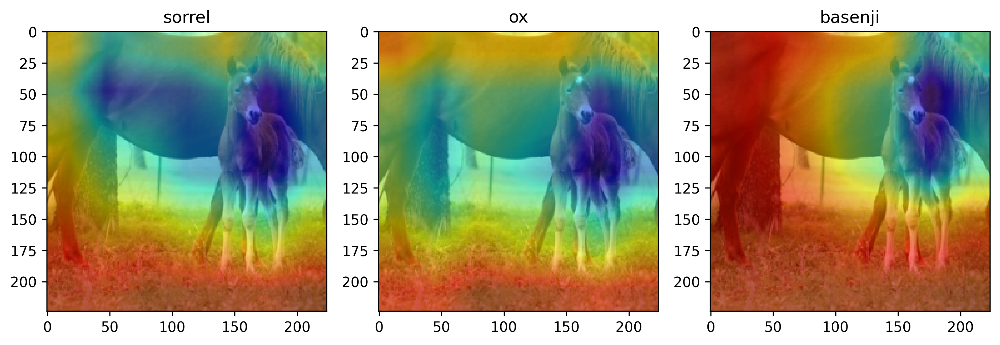

*************************************************************************************************************************************************


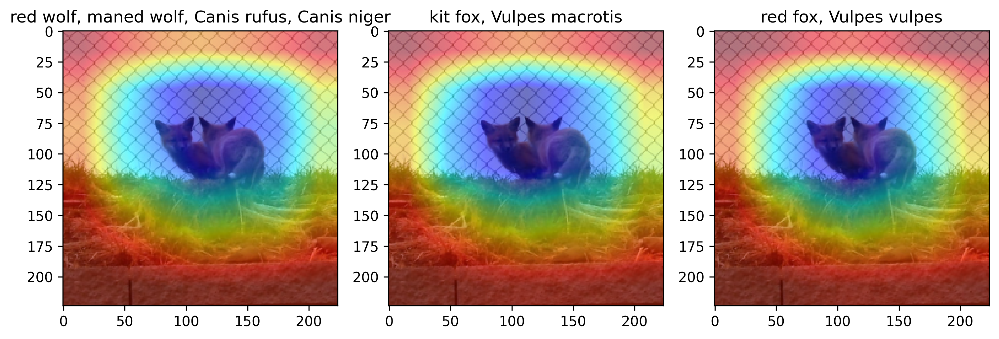

*************************************************************************************************************************************************


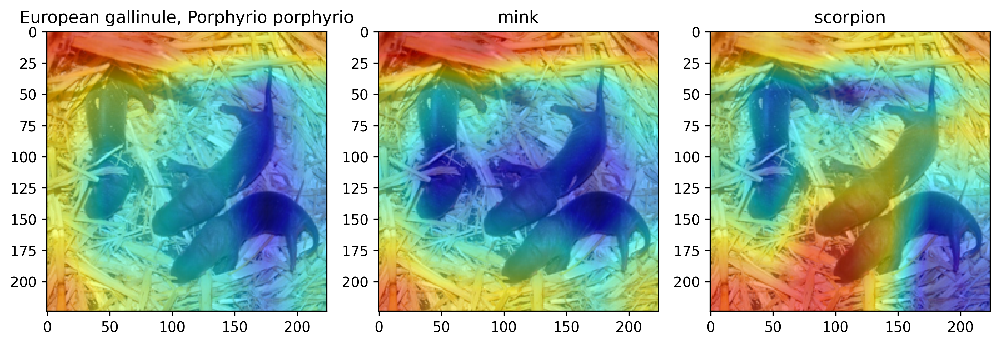

*************************************************************************************************************************************************


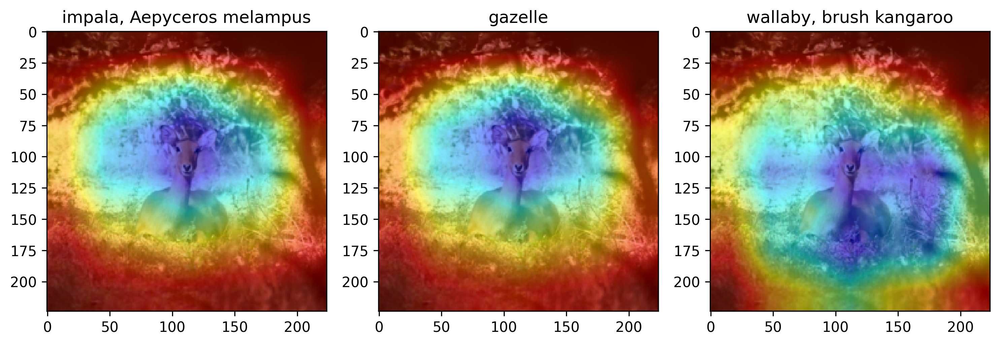

*************************************************************************************************************************************************


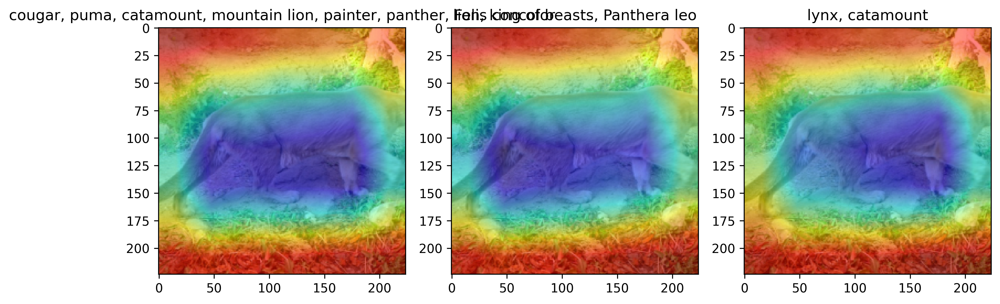

*************************************************************************************************************************************************


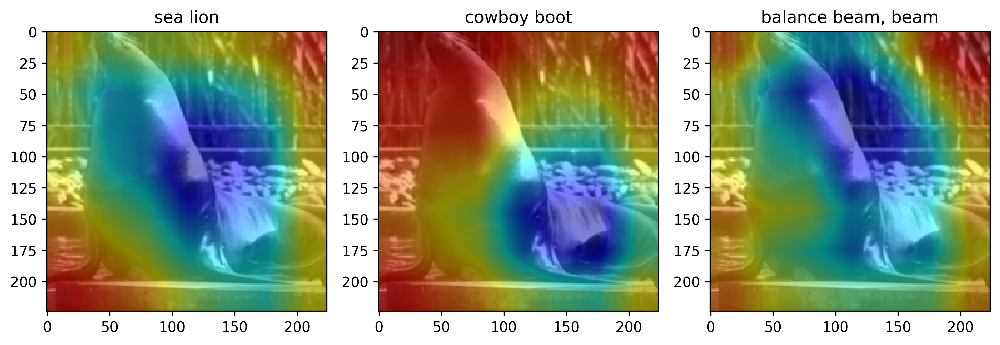

*************************************************************************************************************************************************


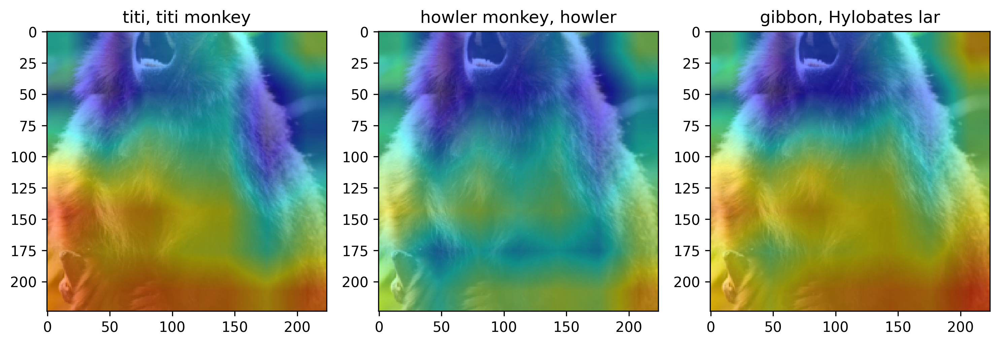

*************************************************************************************************************************************************


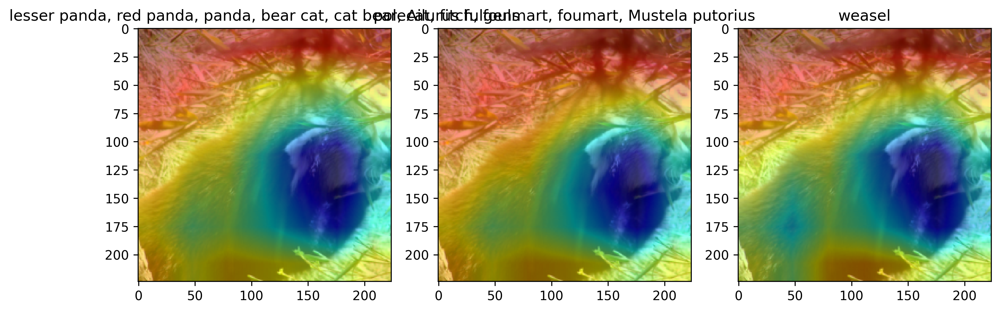

*************************************************************************************************************************************************


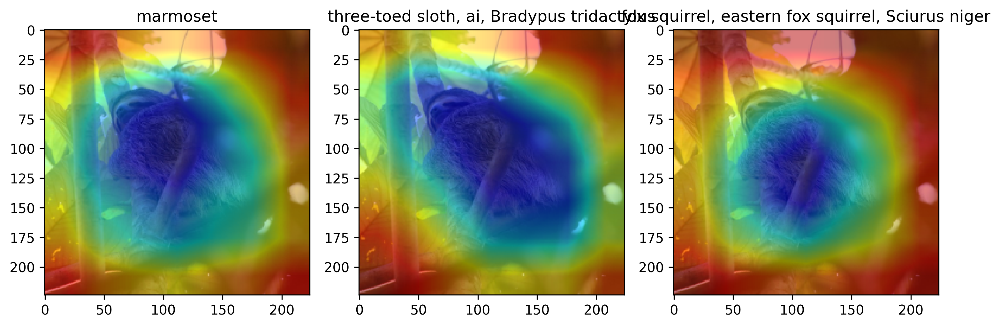

*************************************************************************************************************************************************


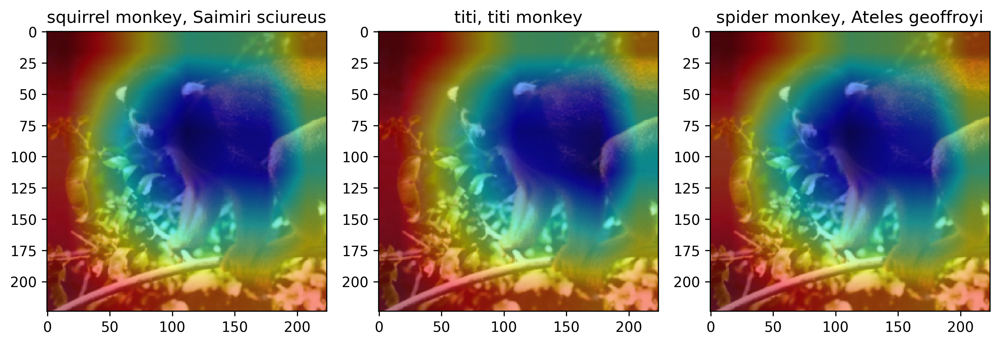

*************************************************************************************************************************************************


In [10]:
for i in range(len(dataset)):
    get_GradCAM_output(resnet34,dataset[i][0])
    print("*"*145)